## Install requirements

In [1]:
def f():
    print('probando')

In [2]:
f()

probando


## Generate a Model Example

In [1]:
ids = ['MLA104243770','MLA118938779','MLA138161531','MLA424101426','MLA429132625','MLA454740950','MLA459654894','MLA478014858','MLA486356802','MLA486356805','MLA486356808','MLA486356811','MLA486356814','MLA486356815','MLA486356819','MLA486356821','MLA486356822','MLA486356825','MLA486356827','MLA794859603','MLA794860068','MLA794860219','MLA794860478','MLA794860900','MLA794861403','MLA794861636','MLA794862195','MLA794862841','MLA794863368','MLA794863560','MLA794863724','MLA794863879','MLA794863932','MLA794864814','MLA794864873','MLA794865547','MLA794866002','MLA794866663','MLA794869164']


In [2]:
recomms = {_id : [reco for reco in ids if reco != _id] for _id in ids}

In [3]:
from embeddeddb import EmbeddedDB
test_recos = EmbeddedDB('test_recos_db')
for item, reco in recomms.items():
    test_recos.put(item, reco)

## True Execution

In [1]:
from process_data import process_and_render_recomms

In [2]:
items_filename = 'ids.csv'  # Ids to get recommendations and calculate coverage
recomms_db = 'test_recos_db'  # Path to model (EmbeddedDB)
filename = "recomms.html"
html_str = process_and_render_recomms(recomms_db, items_filename, amount_to_render=3)  # Get and render Html
with open(filename,"w") as f:  # Save html generated
    f.write(html_str)
    f.close()


Coverage Info with 39
Coverage at 20: 1.0
Coverage at 5: 1.0
Coverage at 10: 1.0
Coverage at 15: 1.0


In [6]:
filename = "recomms.html"
import s3fs  #libreria necesaria para leer de s3 con pandas
import os
s3_key = os.getenv('SECRET_AWS_S3_KEY')
s3_pwd = os.getenv('SECRET_AWS_S3_PWD') 
s3 = s3fs.S3FileSystem(key=s3_key, secret=s3_pwd)

In [12]:
def put_file_to_s3(s3_file, local_file):
    with open(local_file, 'rb') as f:
        with s3.open('s3://' + s3_file, "wb") as out:
            out.write(f.read())
    print('{} saved to {} successfuly'.format(local_file, s3_file))

In [10]:
local_file = '{}'.format(filename)
s3_file = 's3://recomm-machinalis/{}'.format(filename)

In [9]:
!ls

ids.csv      process_data.py   setup.py       utils		   visualize.py
__init__.py  recomms.html      templates      visualization.ipynb
pictures     requirements.txt  test_recos_db  visualization.log


In [13]:
put_file_to_s3(s3_file, local_file)

recomms.html saved to s3://recomm-machinalis/recomms.html successfuly


### Display Here the rendering because problems to download


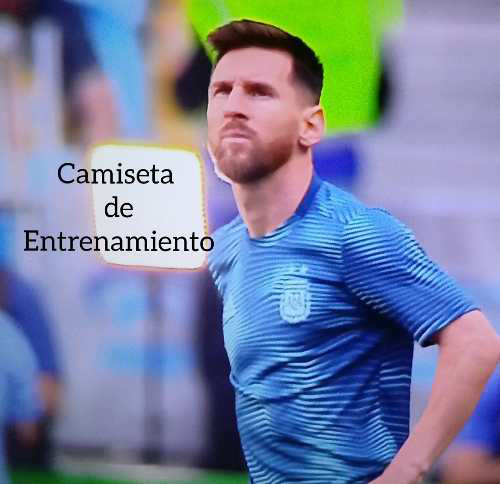
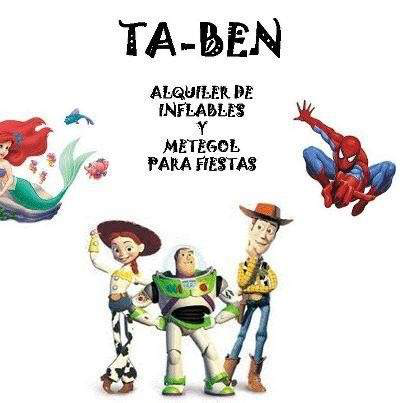
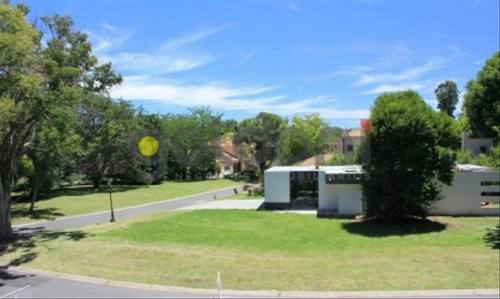
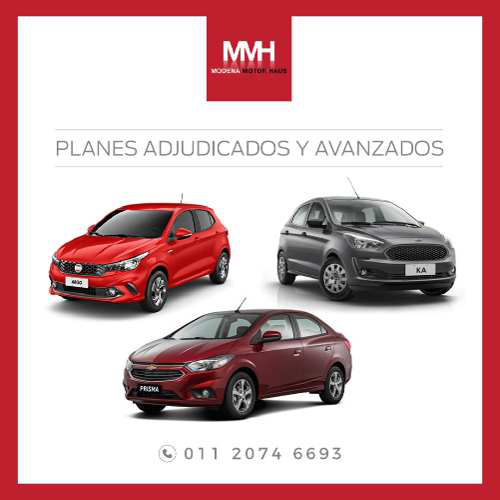
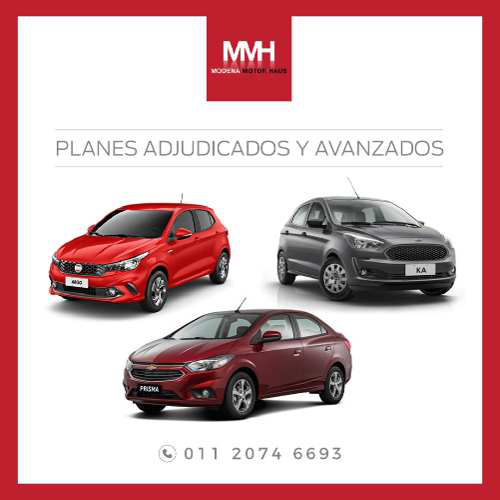
...
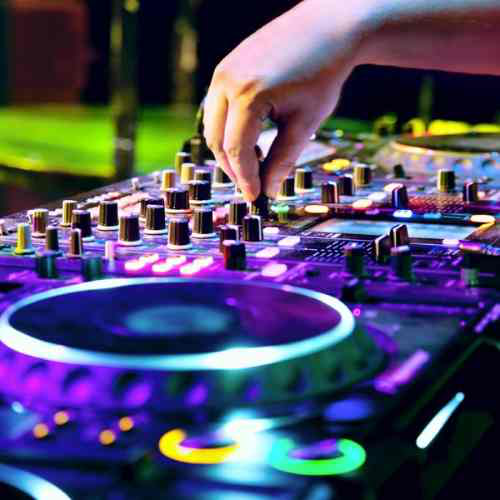
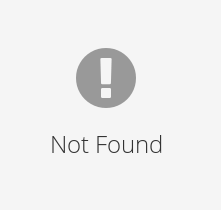
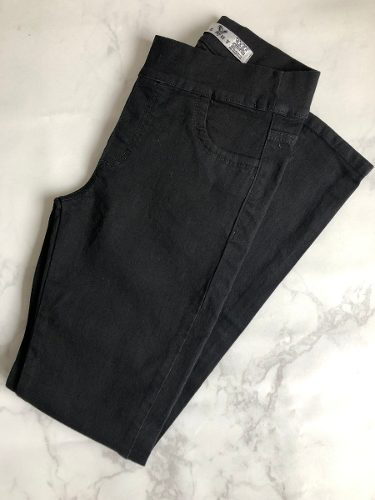
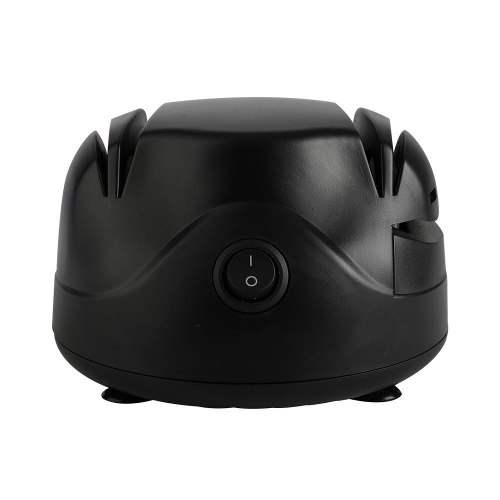
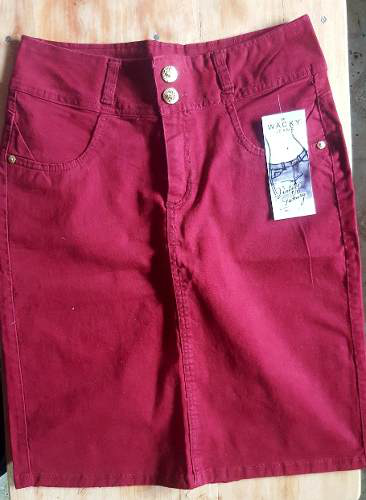

In [3]:
from IPython.display import HTML
HTML(html_str)